# 2- RPK/inhabitant and inequal traffic repartition

In [1]:
import pandas as pd

import plotly.express as px
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt


from tqdm.notebook import tqdm
tqdm.pandas()
pd.options.display.max_columns = 999

import plotly.graph_objects as go
import ipyvuetify as v

from ipywidgets import interact, Checkbox, Select, Output, widgets
import ipywidgets
from datetime import datetime

from IPython.display import display

import time

In [2]:
#### Import various plot file. In case the source file is modified, please rerun preprocess.py ####

# import preprocess
# preprocess.preprocess()

In [3]:

#read continental level data
continental_flows=pd.read_csv('./plot_files/continental_flows.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
continental_flows_non_dir=pd.read_csv('./plot_files/continental_flows_non_dir.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
conti_scatter=pd.read_csv('./plot_files/conti_scatter.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)

#read country level data
country_flows=pd.read_csv('./plot_files/country_flows.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
country_fixed=pd.read_csv('./plot_files/country_fixed.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)
country_fixed_sep_dom=pd.read_csv('./plot_files/country_fixed_sep_dom.csv',sep=',', keep_default_na=False, na_values=['', 'NaN'], index_col=0)

#read flight_level_data
flights_df=pd.read_csv('./plot_files/flights_df.zip',compression='zip', sep=',',keep_default_na=False, na_values=['', 'NaN'], index_col=0)

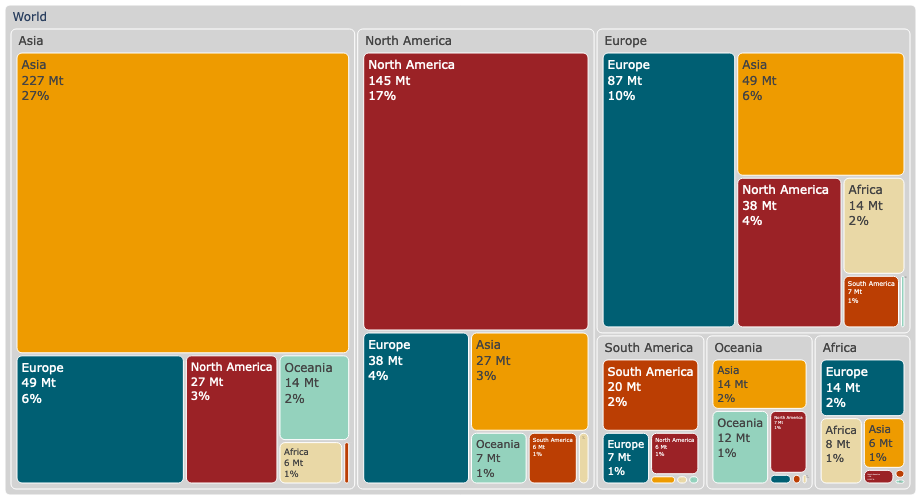

In [4]:
color_discrete_map = {
    "AS": "#EE9B00",
    "AF": "#E9D8A6",
    "EU": "#005F73",
    "NA": "#9B2226",
    "OC": "#94D2BD",
    "SA": "#BB3E03",
    "(?)": "lightgrey",
}


fig = px.treemap(
            continental_flows,
            path=[
                px.Constant("World"),
                "departure_continent_name",
                "arrival_continent_name",
            ],
            values='CO2 (Mt)',
            color="arrival_continent",
            color_discrete_map=color_discrete_map,
        )

fig.update_layout(margin=dict(l=5, r=5, t=5, b=5), height=500, width=1000)

fig.update_traces(
                hovertemplate="Flow=%{id}<br>CO<sub>2</sub>=%{value:.2f} (Mt)"
            )
fig.update_traces(
    marker=dict(cornerradius=5),
    textinfo="label+value+percent entry",
    texttemplate="%{label}<br>%{value:.0f} Mt<br>%{percentEntry}",
)

fig.write_image('treemap.pdf', format='pdf')
fig

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    median_absolute_error,
    mean_absolute_percentage_error,
    r2_score,
)


In [6]:
##### DEV ZONE ######
world_bank_data= pd.read_csv('data/world_bank_data.csv', sep=';')
countries_fixed_test = country_fixed.merge(world_bank_data, left_on='departure_ISO3', right_on='Country Code', how='left').drop(columns={'Country Name','Country Code'})
countries_fixed_test = countries_fixed_test.dropna(subset=['GDP PPP','population'])
# countries_fixed_test = countries_fixed_test.dropna(subset=['GDP PPP','toursim_export_share','population'])

countries_fixed_sep_dom_test = country_fixed_sep_dom.merge(world_bank_data, left_on='departure_ISO3', right_on='Country Code', how='left').drop(columns={'Country Name','Country Code'})
countries_fixed_sep_dom_test = countries_fixed_sep_dom_test.dropna(subset=['GDP PPP','Surf','toursim_export_share','population'])


Let's begin by calculating the Gini coefficients

In [7]:
def calculate_gini(X, Y):
    n = len(X)

    if any(Y[a] < Y[a - 1] for a in range(1, n)):
        raise ValueError("Y should be in non-decreasing order.")

    # using brown formulae to calculate Gini  coefficient: https://fr.wikipedia.org/wiki/Coefficient_de_Gini
    gini = 1 - sum((X[k] - X[k - 1]) * (Y[k] + Y[k - 1]) for k in range(1, n))
    
    return gini

In [8]:
## Gossling article

X=[0,0.89,0.99,1]
Y=[0,0,0.50,1]

calculate_gini(X,Y)

0.935

In [9]:
countries_fixed_test = countries_fixed_test.rename(columns={'ASK': 'ask', 'Seats':'seats', 'CO2 (kg)':'co2'})

Gini Coefficient for ASK: 0.6524
Gini Coefficient for Seats: 0.6064
Gini Coefficient for wealth: 0.4674
Gini Coefficient for CO2: 0.6064
Gini Coefficient for wealth: 0.9350


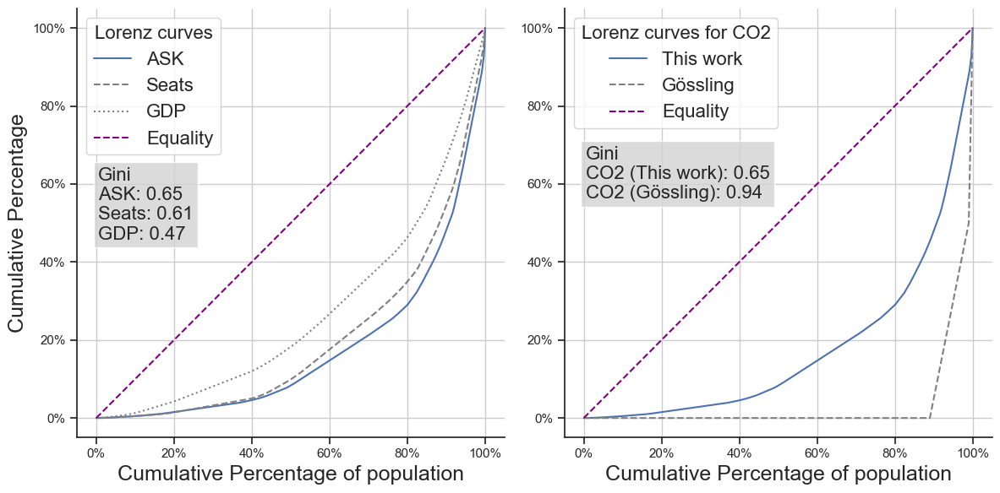

In [10]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

df=countries_fixed_test.copy()

sns.set_style("darkgrid")

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)


# Assuming X, Y are defined for Gössling plot

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))  # Create two subplots

################## ASK INEQUALITIES' ********************

df['ask_ppop']=df['ask']/df['population']
df = df.sort_values(by='ask_ppop')

# Calculate cumulative percentages
df['population Cumulative'] = df['population'].cumsum() / df['population'].sum()
df['ask Cumulative'] = df['ask'].cumsum() / df['ask'].sum()

gini_coefficient_ask = calculate_gini(df['population Cumulative'].to_list(), df['ask Cumulative'].to_list())

print(f"Gini Coefficient for ASK: {gini_coefficient_ask:.4f}")

ax1.plot(df['population Cumulative'], df['ask Cumulative'], linestyle='-', label='ASK')

################## SEATS INEQUALITIES' ********************

df['seats_ppop']=df['seats']/df['population']
df = df.sort_values(by='seats_ppop')

# Calculate cumulative percentages
df['population Cumulative'] = df['population'].cumsum() / df['population'].sum()
df['seats Cumulative'] = df['seats'].cumsum() / df['seats'].sum()

gini_coefficient_seats = calculate_gini(df['population Cumulative'].to_list(), df['seats Cumulative'].to_list())
print(f"Gini Coefficient for Seats: {gini_coefficient_seats:.4f}")

ax1.plot(df['population Cumulative'], df['seats Cumulative'], linestyle='--', color='grey', label='Seats')

################## WEALTH INEQUALITIES' ********************

df['GDP TOT']=df['GDP PPP']*df['population']
df = df.sort_values(by='GDP PPP')

# Calculate cumulative percentages
df['population Cumulative'] = df['population'].cumsum() / df['population'].sum()
df['GDP Cumulative'] = df['GDP TOT'].cumsum() / df['GDP TOT'].sum()

gini_coefficient_wealth = calculate_gini(df['population Cumulative'].to_list(), df['GDP Cumulative'].to_list())
print(f"Gini Coefficient for wealth: {gini_coefficient_wealth:.4f}")

ax1.plot(df['population Cumulative'], df['GDP Cumulative'], linestyle=':', color='grey', label='GDP')

################## CO2 INEQUALITIES' ********************

df['co2_ppop']=df['co2']/df['population']
df = df.sort_values(by='co2_ppop')

# Calculate cumulative percentages
df['population Cumulative'] = df['population'].cumsum() / df['population'].sum()
df['co2 Cumulative'] = df['co2'].cumsum() / df['co2'].sum()

gini_coefficient_CO2 = calculate_gini(df['population Cumulative'].to_list(), df['co2 Cumulative'].to_list())
print(f"Gini Coefficient for CO2: {gini_coefficient_seats:.4f}")


ax2.plot(df['population Cumulative'], df['co2 Cumulative'], linestyle='-', label='This work')

################## GÖSSLING INEQUALITIES' ********************

gini_coefficient_goSs = calculate_gini(X,Y)
print(f"Gini Coefficient for wealth: {gini_coefficient_goSs:.4f}")

ax2.plot(X, Y, linestyle='--', color='grey', label='Gössling')

# Common settings for both subplots
for ax in [ax1]:
    ax.plot([0, 1], [0, 1], linestyle='--', label='Equality', color='purple')  # 45-degree line for reference
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0%}'.format(x)))
    ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
    ax.set_xlabel('Cumulative Percentage of population', fontsize=18)
    ax.set_ylabel('Cumulative Percentage', fontsize=18)
    ax.legend(title='Lorenz curves', loc='upper left', fontsize=16, title_fontsize=16)
    ax.grid(True)
    
    
ax2.plot([0, 1], [0, 1], linestyle='--', label='Equality', color='purple')  # 45-degree line for reference
ax2.xaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0%}'.format(x)))
ax2.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
ax2.set_xlabel('Cumulative Percentage of population', fontsize=18)
# ax2.set_ylabel('Cumulative Percentage', fontsize=14)
ax2.legend(title='Lorenz curves for CO2', loc='upper left', fontsize=16, title_fontsize=16)
ax2.grid(True)
    
    
    
text = f'Gini\nASK: {gini_coefficient_ask:.2f}\nSeats: {gini_coefficient_seats:.2f}\nGDP: {gini_coefficient_wealth:.2f}'
ax1.annotate(text, xy=(0.05, 0.63), xycoords='axes fraction', bbox=dict(facecolor='lightgrey', alpha=0.8),
             fontsize=16, ha='left', va='top')


text = f'Gini\nCO2 (This work): {gini_coefficient_CO2:.2f}\nCO2 (Gössling): {gini_coefficient_goSs:.2f}'
ax2.annotate(text, xy=(0.05, 0.68), xycoords='axes fraction', bbox=dict(facecolor='lightgrey', alpha=0.8),
             fontsize=16, ha='left', va='top')


# Adjust layout
plt.tight_layout()

# Save and show the plot
plt.savefig('gini.pdf', bbox_inches='tight')
plt.show()

0.837995035717394
[0.00000000e+00 2.47113570e-05 3.69900218e-10]


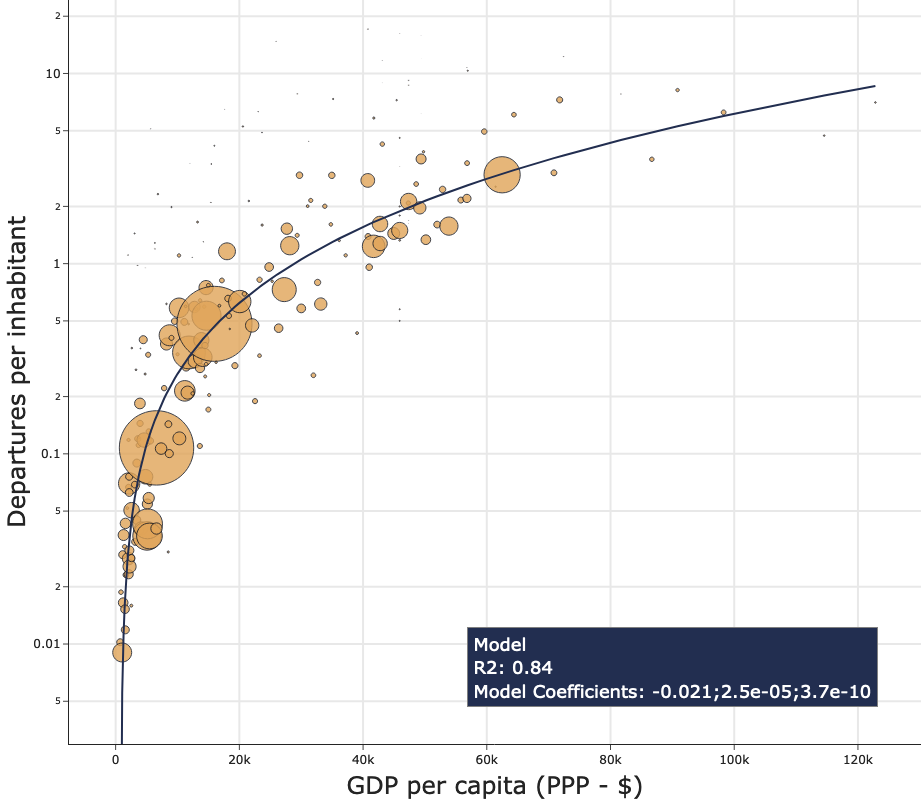

In [11]:
### Polynomial regression

load_factor=0.83

X = countries_fixed_test[['GDP PPP']].copy()
y = (countries_fixed_test['seats']*load_factor)/countries_fixed_test['population']

##### Polynomial #####
w=countries_fixed_test['population']


# # Create polynomial features
poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

# # Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y, sample_weight=w)

# Generate predictions
y_pred = model.predict(X_poly)



df_viz = pd.concat([X,countries_fixed_test[['departure_country_name', 'population']], y], axis=1).rename(columns={0:'y'})
df_viz['y_pred']=y_pred


df_viz=df_viz.sort_values(by='GDP PPP')

fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter(
    x=df_viz['GDP PPP'],
    y=df_viz['y'],
    mode='markers',
    marker=dict(
        size=0.000002*df_viz['population'],
        opacity=0.8 , # Set the marker opacity,
        sizemode='area', 
        color="#E0A458",
        line=dict(color='#0c111d'),
    ),
    text=df_viz['departure_country_name'],
    # name='Data'
))
# fig= go.Figure()



fig.add_trace(go.Scatter(
    y=df_viz['y_pred'].values,
    x=df_viz['GDP PPP'].values,
    opacity=1,
    line=dict(color='#222E50'),
    # name='Regression'
))


fig.update_layout(
    height=800,
        xaxis_title='GDP per capita (PPP - $)',
        yaxis_title='Departures per inhabitant',
        yaxis_type='log',
    width=1400,
    xaxis_title_font=dict(size=24),  
    yaxis_title_font=dict(size=24),
    xaxis=dict(showgrid=True, gridwidth=2),
    yaxis=dict(showgrid=True, gridwidth=2),
    showlegend=False, 
    
)

fig.update_yaxes(range=[np.log(0.08), np.log(4)])

r2 = r2_score(y, y_pred, sample_weight=w)

fig.add_annotation(
    text=f'Model<br>R2: {r2:.2f}<br>Model Coefficients: {model.intercept_:.2};{model.coef_[1]:.2};{model.coef_[2]:.2}',
    showarrow=False,
    xref='paper',
    yref='paper',
    x=0.95,
    y=0.05,
    font=dict(size=18, color='white'),  # Text style
    align='left',
    bgcolor='rgb(34, 46, 80, 0.25)',  # Box background color
    bordercolor='gray',  # Box border color
    borderwidth=1,  # Box border width
    borderpad=4,
)

fig.update_layout(margin=dict(r=0, l=0, b=0, t=0), template='simple_white')


print(r2)
print(model.coef_)
fig.write_image('GDP_regression.pdf', format='pdf')
fig

0.5792740004625873
-1.0565205421194013
[ 0.00000000e+00  1.01610196e-04  3.60453615e-02 -4.63059197e-10
  3.88394326e-07 -2.26562090e-05]


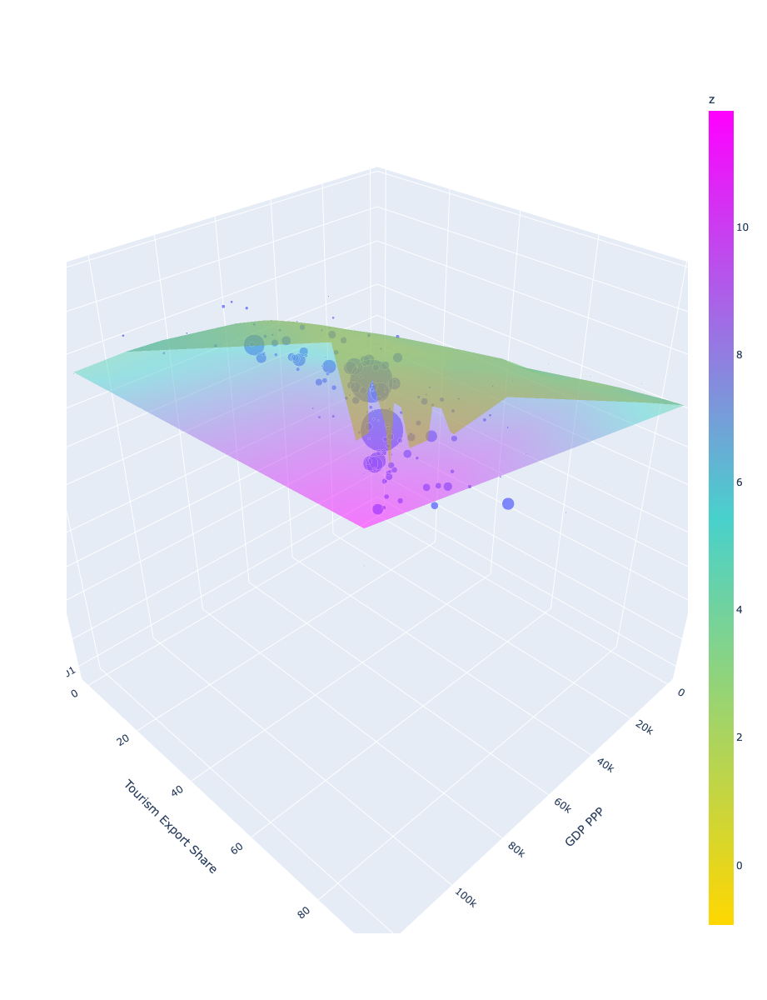

In [12]:
### Multipolynomial regression by adding the toursim export share
# ==> very limited improvement of the fit

countries_fixed_test = countries_fixed_test.dropna(subset=['GDP PPP','toursim_export_share','population'])



X = countries_fixed_test[['GDP PPP', 'toursim_export_share']].copy()
y = (load_factor*countries_fixed_test['seats']/countries_fixed_test['population'])

##### Polynomial #####
w=countries_fixed_test['population']


# # Create polynomial features
poly_features = PolynomialFeatures(degree=[1,2])
X_poly = poly_features.fit_transform(X)

# # Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y)

# Generate predictions
y_pred = model.predict(X_poly)



df_viz = pd.concat([X,countries_fixed_test[['departure_country_name', 'population']], y], axis=1).rename(columns={0:'y'})
df_viz['y_pred']=y_pred


df_viz=df_viz.sort_values(by='GDP PPP')

fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter3d(
    x=df_viz['GDP PPP'],
    y=df_viz['toursim_export_share'],
    z=df_viz['y'],
    mode='markers',
    marker=dict(
        size=0.000005*df_viz['population'],
        opacity=0.8,  # Set the marker opacity
        sizemode='area',
    ),
    text=df_viz['departure_country_name'],
))
# fig= go.Figure()



fig.add_trace(go.Mesh3d(
    z=df_viz['y_pred'].values,
    intensity=df_viz['y_pred'].values,
    x=df_viz['GDP PPP'].values,
    y=df_viz['toursim_export_share'].values,
    opacity=0.5,
    colorbar_title='z',
        colorscale=[[0, 'gold'],
                    [0.5, 'mediumturquoise'],
                    [1, 'magenta']],
    
    # log_y=True, 
    # mode='lines',
))


fig.update_layout(
    height=1200,
    scene=dict(
        xaxis_title='GDP PPP',
        yaxis_title='Tourism Export Share',
        zaxis_title='Departures per inhabitant',
        zaxis_type='log'
    )
)


r2 = r2_score(y, y_pred)
print(r2)
print(model.intercept_)
print(model.coef_)
fig

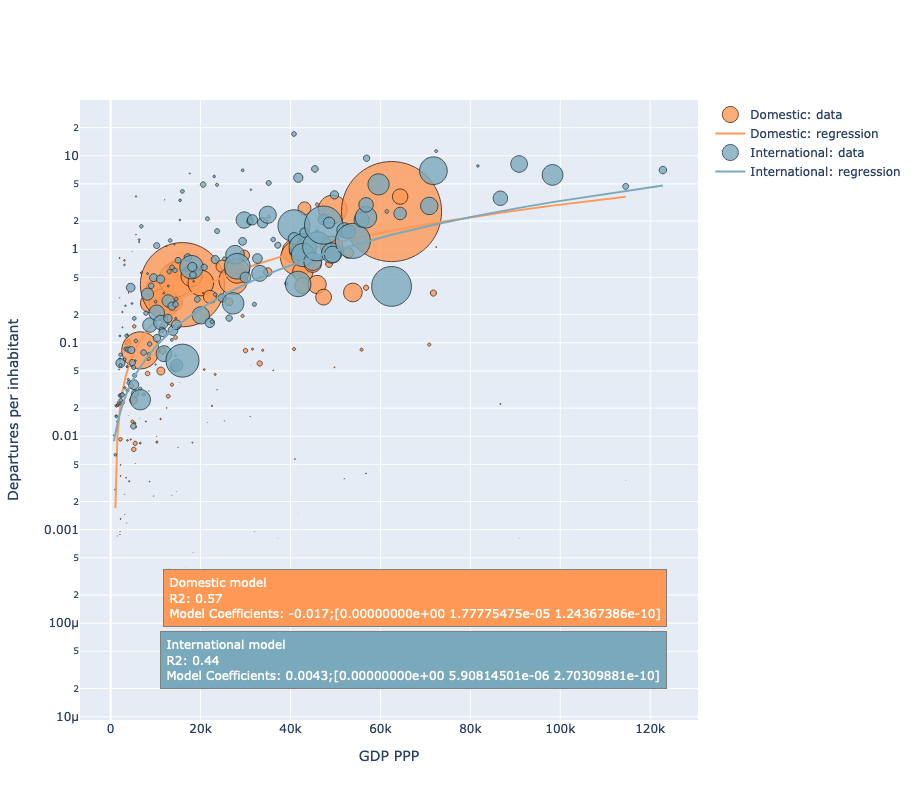

In [13]:
### Polynomial regression


country_dom=countries_fixed_sep_dom_test[countries_fixed_sep_dom_test['domestic']==1 ].copy()
country_dom=country_dom[country_dom['seats']/country_dom['population']>0.00]


X = country_dom[['GDP PPP']].copy()
y = (load_factor*country_dom['seats']/country_dom['population'])

##### Polynomial #####
w=country_dom['population']


# # Create polynomial features
poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

# # Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y, sample_weight=w)

# Generate predictions
y_pred = model.predict(X_poly)



df_viz = pd.concat([X,country_dom[['departure_country_name', 'population', 'seats']], y], axis=1).rename(columns={0:'y'})
df_viz['y_pred']=y_pred


df_viz=df_viz.sort_values(by='GDP PPP')

fig = go.Figure()

# Add a scatter plot
fig.add_trace(go.Scatter(
    x=df_viz['GDP PPP'],
    y=df_viz['y'],
    mode='markers',
    marker=dict(
        size=0.000005*df_viz['seats'],
        opacity=0.8 , # Set the marker opacity,
        color='rgb(255, 153, 85)',
        sizemode='area',
        line=dict(color='#3D1800')
    ),
    text=df_viz['departure_country_name'],
    name='Domestic: data'
))
# fig= go.Figure()



fig.add_trace(go.Scatter(
    y=df_viz['y_pred'].values,
    x=df_viz['GDP PPP'].values,
    opacity=1,
    line=dict(color='rgb(255, 153, 85)'),
    name='Domestic: regression'
))


r2 = r2_score(y, y_pred, sample_weight=w)


fig.add_annotation(
    text=f'Domestic model<br>R2: {r2:.2f}<br>Model Coefficients: {model.intercept_:.2};{model.coef_}',
    showarrow=False,
    xref='paper',
    yref='paper',
    x=0.95,
    y=0.15,
    font=dict(size=12, color='white'),  # Text style
    align='left',
    bgcolor='rgb(255, 153, 85, 0.25)',  # Box background color
    bordercolor='gray',  # Box border color
    borderwidth=1,  # Box border width
    borderpad=4,
)

##################### DOMESTIC #########################################
country_int=countries_fixed_sep_dom_test[countries_fixed_sep_dom_test['domestic']==0].copy()
country_int=country_int[country_int['seats']/country_int['population']>0.00]


### Polynomial regression

X = country_int[['GDP PPP']].copy()
y = (load_factor*country_int['seats']/country_int['population'])

##### Polynomial #####
w=country_int['population']


# # Create polynomial features
poly_features = PolynomialFeatures(degree=2)
X_poly = poly_features.fit_transform(X)

# # Fit the polynomial regression model
model = LinearRegression()
model.fit(X_poly, y, sample_weight=w)

# Generate predictions
y_pred = model.predict(X_poly)



df_viz = pd.concat([X,country_int[['departure_country_name', 'population', 'seats']], y], axis=1).rename(columns={0:'y'})
df_viz['y_pred']=y_pred


df_viz=df_viz.sort_values(by='GDP PPP')


# Add a scatter plot
fig.add_trace(go.Scatter(
    x=df_viz['GDP PPP'],
    y=df_viz['y'],
    mode='markers',
    marker=dict(
        size=0.000005*df_viz['seats'],
        opacity=0.8 , # Set the marker opacity,
        sizemode='area',
        color='rgb(123, 169, 188)', 
        line=dict(color='#1B2E36')
    ),
    text=df_viz['departure_country_name'],
    name='International: data'
))
# fig= go.Figure()



fig.add_trace(go.Scatter(
    y=df_viz['y_pred'].values,
    x=df_viz['GDP PPP'].values,
    opacity=1,
    line=dict(color='rgb(123, 169, 188)'),
    name='International: regression'
))


fig.update_layout(
    height=800,
        xaxis_title='GDP PPP',
        yaxis_title='Departures per inhabitant',
        yaxis_type='log',
        # yaxis=dict(range=[1, None])
    
)

r2 = r2_score(y, y_pred, sample_weight=w)

fig.add_annotation(
    text=f'International model<br>R2: {r2:.2f}<br>Model Coefficients: {model.intercept_:.2};{model.coef_}',
    showarrow=False,
    xref='paper',
    yref='paper',
    x=0.95,
    y=0.05,
    font=dict(size=12, color='white'),  # Text style
    align='left',
    bgcolor='rgb(123, 169, 188, 0.25)',  # Box background color
    bordercolor='gray',  # Box border color
    borderwidth=1,  # Box border width
    borderpad=4,
)

fig

In [17]:
countries_fixed_test = country_fixed.merge(world_bank_data, left_on='departure_ISO3', right_on='Country Code', how='left').drop(columns={'Country Name','Country Code'})
# countries_fixed_test = countries_fixed_test.dropna(subset=['population'])
countries_fixed_test = countries_fixed_test.rename(columns={'ASK': 'ask', 'Seats':'seats', 'CO2 (kg)':'co2'})

In [18]:
countries_fixed_test[countries_fixed_test.population.isna()]['departure_ISO3']

67     FLK
188    SHN
Name: departure_ISO3, dtype: object

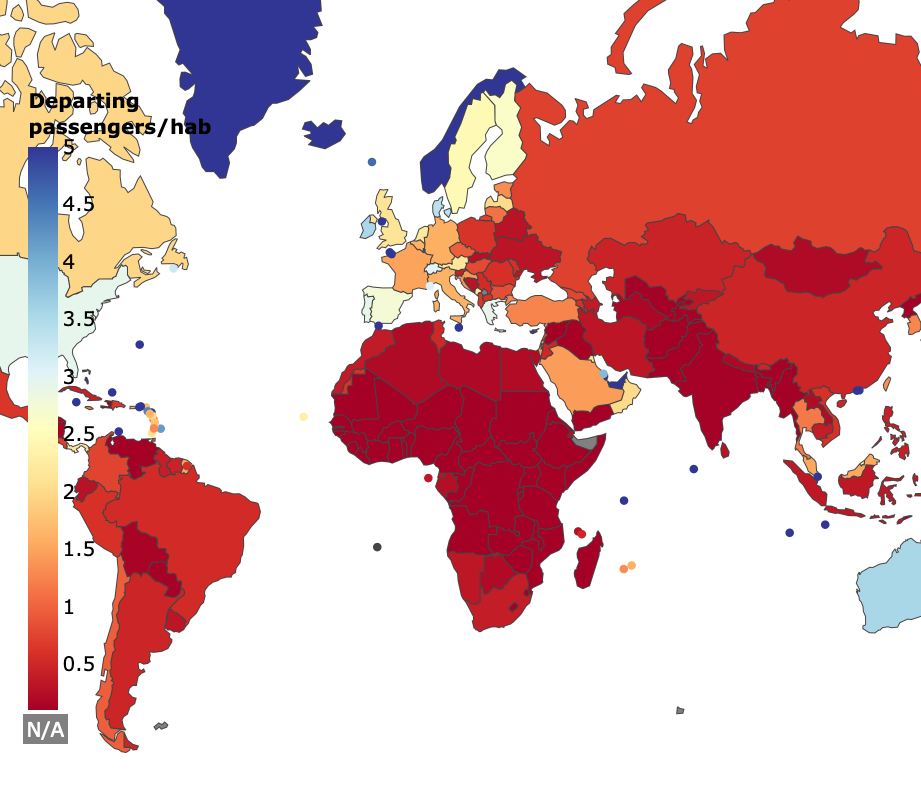

In [19]:
countries_fixed_test['seathab']=load_factor*countries_fixed_test['seats']/countries_fixed_test['population']

import geopandas as gpd
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Join the data frame with the shapefile
gdf = world.merge(countries_fixed_test, left_on='iso_a3', right_on='departure_ISO3', how='left')
gdf.head()


gdf_na=gdf[gdf.seathab.isna()]



###ASK 


# Create a new dataframe for countries not present in gdf
countries_not_in_gdf = countries_fixed_test[~countries_fixed_test['departure_ISO3'].isin(gdf['iso_a3'])]


# Choropleth map
fig = px.choropleth_mapbox(
    gdf,
    geojson=gdf.geometry,
    locations=gdf.index,
    mapbox_style='white-bg',
    color_continuous_scale=px.colors.diverging.RdYlBu,
    custom_data=[gdf['name'], gdf['seathab']],  # Add custom data for hover
    range_color=[0.1, 5],
    color='seathab',
    height=700
)

fig.add_trace(
    px.choropleth_mapbox(
    gdf_na,
    geojson=gdf_na.geometry,
    locations=gdf_na.index,
    color_discrete_sequence=["gray"],
    custom_data=[gdf_na['name']],  # Add custom data for hover
    height=700,
).data[0])


hover_template_choropleth = '%{customdata[0]}<br>Seathab: %{customdata[1]:.2f}<extra></extra>'
fig.update_traces(showlegend=False,hovertemplate=hover_template_choropleth)

# Scatter map for countries not present in gdf
fig.add_trace(go.Scattermapbox(
    lat=countries_not_in_gdf['departure_lat'],  # Use the appropriate column name for latitude
    lon=countries_not_in_gdf['departure_lon'],  # Use the appropriate column name for longitude
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=9,
        color=countries_not_in_gdf['seathab'],
        colorscale=px.colors.diverging.RdYlBu,
        cmin=0.1,
        cmax=5, 
    ),
    hoverinfo='text',  # Specify hover info
    hovertext=countries_not_in_gdf['departure_country_name'] + '<br>Seathab: ' + countries_not_in_gdf['seathab'].astype(str)
))

# Update layout for a better display
fig.update_layout(
    mapbox=dict(center=dict(lat=20, lon=15), zoom=1.5),
    margin=dict(r=0, l=0, b=0, t=0),
    coloraxis_colorbar=dict(
                 title='<b>Departing<br>passengers/hab',
        tickfont=dict(size=20, color='black'),
                    title_font=dict(size=20, color='black'),
                 len=0.8, x=0.02),
    height=800
)



fig.add_annotation(
    x=0.025,  
    y=0.07,  
    text='N/A',
    showarrow=False,
    font=dict(size=20, color='white'),  
    bgcolor='grey',  
    bordercolor='grey',  

)


# 
# fig.update_geos(fitbounds="locations", visible=False)

fig.show()

fig.write_image("dep_phab.pdf", format='pdf', width=1600)

In [20]:
load_factor*countries_fixed_test['seats'].sum()/countries_fixed_test['population'].sum()

0.5973726918577732

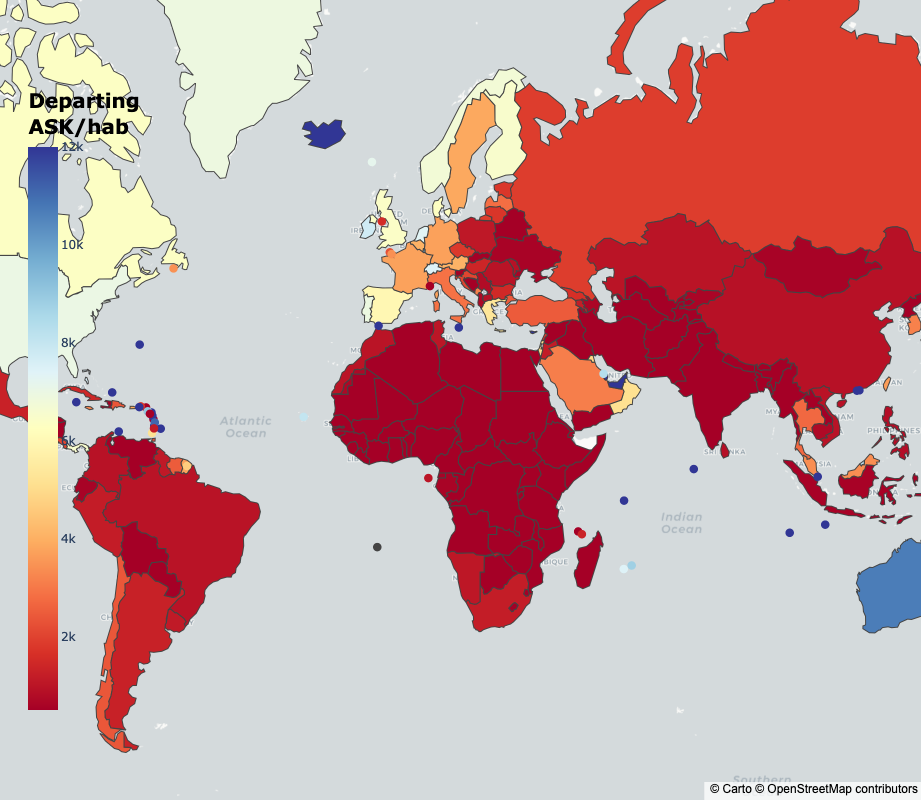

In [21]:
countries_fixed_test['askhab']=countries_fixed_test['ask']/countries_fixed_test['population']

import geopandas as gpd
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Join the data frame with the shapefile
gdf = world.merge(countries_fixed_test, left_on='iso_a3', right_on='departure_ISO3')
gdf.head()

###ASK 


# Create a new dataframe for countries not present in gdf
countries_not_in_gdf = countries_fixed_test[~countries_fixed_test['departure_ISO3'].isin(gdf['iso_a3'])]


# Choropleth map
fig = px.choropleth_mapbox(
    gdf,
    geojson=gdf.geometry,
    locations=gdf.index,
    mapbox_style='carto-positron',
    color_continuous_scale=px.colors.diverging.RdYlBu,
    custom_data=[gdf['name'], gdf['askhab']],  # Add custom data for hover
    range_color=[500, 12000],
    color='askhab',
    height=700
)

hover_template_choropleth = '%{customdata[0]}<br>ASK hab: %{customdata[1]:.2f}<extra></extra>'
fig.update_traces(hovertemplate=hover_template_choropleth)

# Scatter map for countries not present in gdf
fig.add_trace(go.Scattermapbox(
    lat=countries_not_in_gdf['departure_lat'],  # Use the appropriate column name for latitude
    lon=countries_not_in_gdf['departure_lon'],  # Use the appropriate column name for longitude
    mode='markers',
    marker=go.scattermapbox.Marker(
        size=9,
        color=countries_not_in_gdf['askhab'],
        colorscale=px.colors.diverging.RdYlBu,
        cmin=500,
        cmax=12000, 
    ),
    hoverinfo='text',  # Specify hover info
    hovertext=countries_not_in_gdf['departure_country_name'] + '<br>Ask hab: ' + countries_not_in_gdf['askhab'].astype(str)
))

# Update layout for a better display
fig.update_layout(
    mapbox=dict(center=dict(lat=20, lon=15), zoom=1.5),
    margin=dict(r=0, l=0, b=0, t=0),
    coloraxis_colorbar=dict(
                 title='<b>Departing<br>ASK/hab',
                    title_font=dict(size=20, color='black'),
                 len=0.8, x=0.02),
    height=800
)



# 
# fig.update_geos(fitbounds="locations", visible=False)

fig.show()

# fig.write_image("ask_phab.pdf", format='pdf', width=1600)

In [22]:
countries_fixed_test.seats.sum()/countries_fixed_test.population.sum()
countries_fixed_test['homogeneous_co2hab']=countries_fixed_test.co2.sum()/countries_fixed_test.population.sum()

In [23]:
countries_fixed_test['homogeneous_co2']=countries_fixed_test.population*countries_fixed_test.co2.sum()/countries_fixed_test.population.sum()

In [24]:
countries_fixed_test['co2'].mean()

3608801357.339884

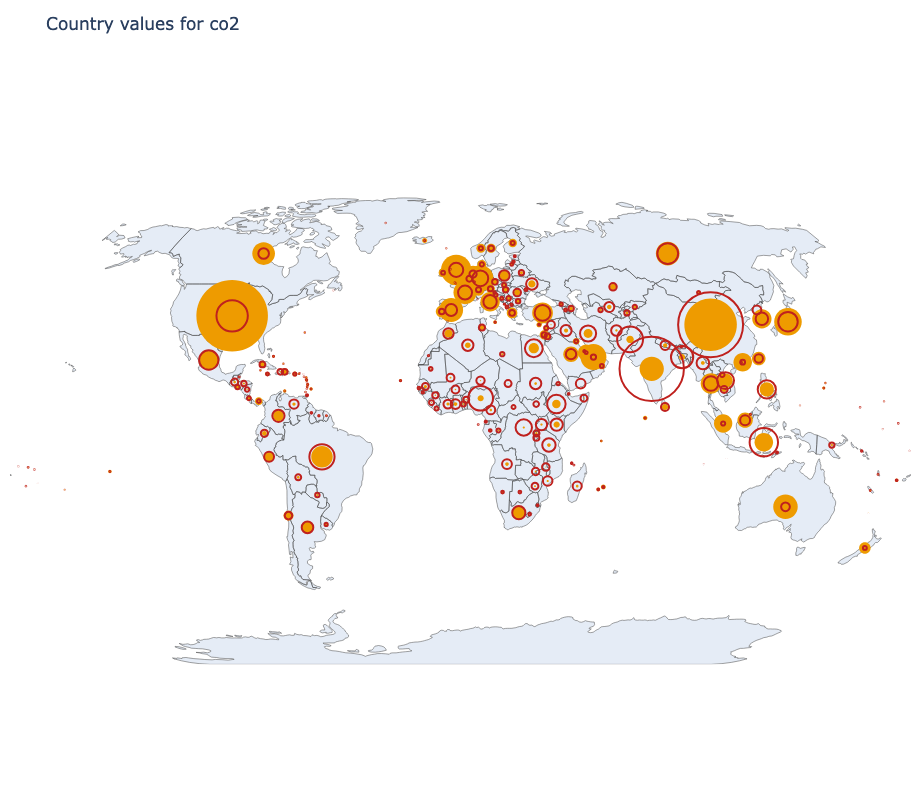

In [25]:
countries_fixed_test = countries_fixed_test.dropna(subset=['population'])
fig = go.Figure()


fig.add_trace(go.Scattergeo(
    lon=countries_fixed_test['departure_lon'],
    lat=countries_fixed_test['departure_lat'],
    hoverinfo='text',
    text=load_factor*countries_fixed_test['co2'],
    mode='markers',
    marker=dict(
        size=countries_fixed_test['co2'] / (.02 * countries_fixed_test['co2'].mean()),
        sizemode='area',
        color='rgb(238,155,0)',
        line=dict(width=0, color='black'), opacity=1
    ),
    customdata=countries_fixed_test[['departure_country_name']],
    hovertemplate="Total departures from: %{customdata[0]}<br>" +
                  'co2' + ": %{text:.0f}<br>" +
                  "<extra></extra>",

))

fig.add_trace(go.Scattergeo(
    lon=countries_fixed_test['departure_lon'],
    lat=countries_fixed_test['departure_lat'],
    hoverinfo='text',
    text=load_factor*countries_fixed_test['homogeneous_co2'],
    mode='markers',
    marker=dict(
        size=countries_fixed_test['homogeneous_co2'] / (.02 * countries_fixed_test['co2'].mean()),
        sizemode='area',
        color='rgba(238,155,0,0)',
        line=dict(width=2, color='#BF211E'), opacity=1
    ),
    customdata=countries_fixed_test[['departure_country_name']],
    hovertemplate="Total departures from: %{customdata[0]}<br>" +
                  'homogeneous_co2' + ": %{text:.0f}<br>" +
                  "<extra></extra>",

))




fig.update_layout(
    geo=dict(
        showland=True,
        bgcolor='white',
        countrywidth=0.5,
        subunitwidth=0.5,
        projection=dict(type='natural earth', )
    ),
)


fig.update_geos(showcountries=True, visible=False)
fig.update_layout(showlegend=False, height=800, title='Country values for {}'.format('co2'))
fig.update_layout(margin=dict(l=5, r=5, t=60, b=5))  # Adjust layout margins and padding

In [26]:
countries_fixed_test[countries_fixed_test.departure_ISO3=='USA']['co2'].values # inlcudes lf 

array([1.86245128e+11])

In [27]:
countries_fixed_test['co2_amer']=countries_fixed_test.population*countries_fixed_test[countries_fixed_test.departure_ISO3=='USA']['co2'].values/countries_fixed_test[countries_fixed_test.departure_ISO3=='USA']['population'].values

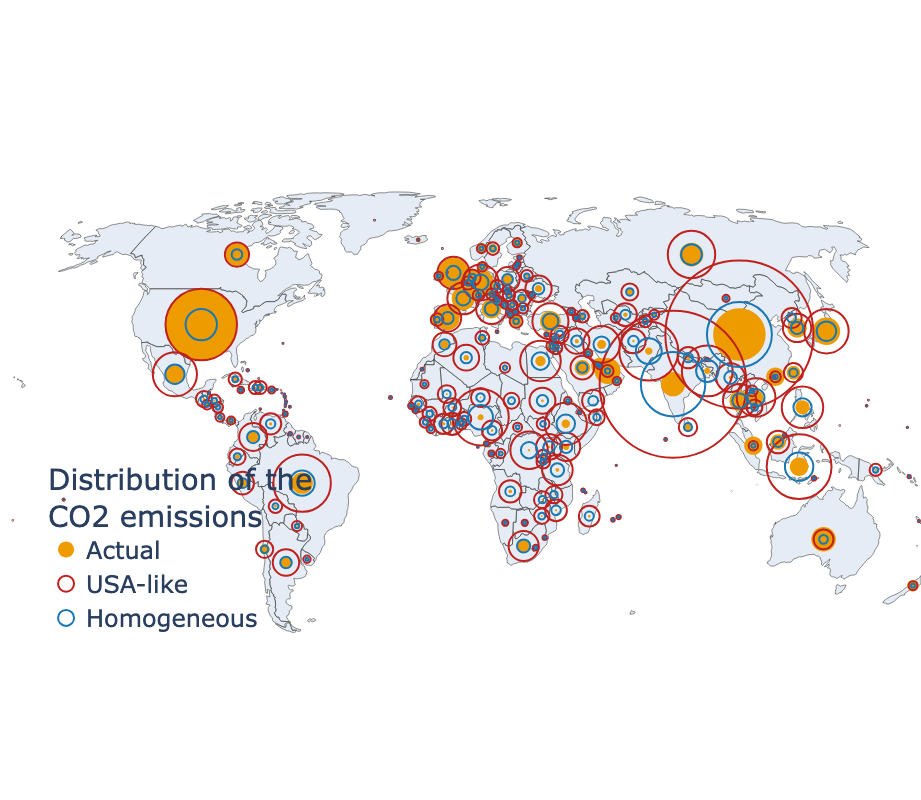

In [28]:
fig = go.Figure()


fig.add_trace(go.Scattergeo(
    lon=countries_fixed_test['departure_lon'],
    lat=countries_fixed_test['departure_lat'],
    hoverinfo='text',
    text=load_factor*countries_fixed_test['co2'],
    mode='markers',
    marker=dict(
        size=countries_fixed_test['co2'] / (.02 *countries_fixed_test['co2'].mean()),
        sizemode='area',
        color='rgb(238,155,0)',
        line=dict(width=0, color='black'), opacity=1
    ),
    customdata=countries_fixed_test[['departure_country_name']],
    hovertemplate="Total departures from: %{customdata[0]}<br>" +
                  'co2' + ": %{text:.0f}<br>" +
                  "<extra></extra>",
    name='Actual'

))

fig.add_trace(go.Scattergeo(
    lon=countries_fixed_test['departure_lon'],
    lat=countries_fixed_test['departure_lat'],
    hoverinfo='text',
    text=countries_fixed_test['co2_amer'],
    mode='markers',
    marker=dict(
        size=countries_fixed_test['co2_amer'] / (.02 *countries_fixed_test['co2'].mean()),
        sizemode='area',
        color='rgba(238,155,0,0)',
        line=dict(width=2, color='#BF211E'), opacity=1
    ),
    customdata=countries_fixed_test[['departure_country_name']],
    hovertemplate="Total departures from: %{customdata[0]}<br>" +
                  'co2_amer' + ": %{text:.0f}<br>" +
                  "<extra></extra>",
    name='USA-like'

))

fig.add_trace(go.Scattergeo(
    lon=countries_fixed_test['departure_lon'],
    lat=countries_fixed_test['departure_lat'],
    hoverinfo='text',
    text=load_factor*countries_fixed_test['homogeneous_co2'],
    mode='markers',
    marker=dict(
        size=countries_fixed_test['homogeneous_co2'] / (.02 *countries_fixed_test['co2'].mean()),
        sizemode='area',
        color='rgba(238,155,0,0)',
        line=dict(width=2, color='#1978B3'), opacity=1
    ),
    customdata=countries_fixed_test[['departure_country_name']],
    hovertemplate="Total departures from: %{customdata[0]}<br>" +
                  'homogeneous_co2' + ": %{text:.0f}<br>" +
                  "<extra></extra>",
    name='Homogeneous'

))


# Update layout for a better display
fig.update_layout(
    margin=dict(r=0, l=0, b=0, t=0),
    legend=dict(title='Distribution of the<br>CO2 emissions', x=0.05, y=0.2,font=dict(size=24), bgcolor='rgba(0, 0, 0, 0)', xanchor='left', yanchor='bottom'),
    height=800, 
    width=1600
)



fig.update_layout(
    geo=dict(
        showland=True,
        bgcolor='white',
        countrywidth=0.6,
        # projection_scale=1.2,  # Adjust the zoom level
        projection=dict(type='natural earth', )
    ),
)



fig.update_geos(fitbounds='locations',showcountries=True, visible=False)

fig.show()

fig.write_image("alternate.pdf", format='pdf', width=1600)

In [29]:
print('Total number of co2: {}'.format(countries_fixed_test['co2'].sum()))


print('Total number of co2 american: {}'.format(countries_fixed_test['co2_amer'].sum())) # includes lf

a=(countries_fixed_test['co2_amer'].sum()-countries_fixed_test['co2'].sum())/(countries_fixed_test['co2'].sum())*100


print('Total number of co2 evol if american: {}'.format(a))

Total number of co2: 844434899827.9048
Total number of co2 american: 4389664106573.273
Total number of co2 evol if american: 419.8345198034666
